### Imports and Settings

In [30]:
# import table
from IPython.display import Image as ImgDisp
from PIL import Image, ImageFont
from transformers import pipeline, DetrImageProcessor, DetrForObjectDetection
from typing import Optional
from ultralytics import RTDETR
import warnings

from detectors.transformers import detect
from detectors.utils.visualize import add_bounding_box

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [29]:
# settings
warnings.filterwarnings("ignore", message=".*copying from a non-meta parameter.*")
font = ImageFont.truetype("tahoma.ttf", 12)

### Model Example

In [3]:
# load detection transformer model and feature extractor
feature_extractor = DetrImageProcessor.from_pretrained('facebook/detr-resnet-101')
model = DetrForObjectDetection.from_pretrained('facebook/detr-resnet-101')

# initialize object detection pipeline via transformers
object_detector = pipeline("object-detection", model = model, feature_extractor = feature_extractor)

Some weights of the model checkpoint at facebook/detr-resnet-101 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


### Detector

In [ ]:
# detect everything
dets = detect(['images/street_large.jpg', 
               'images/street_medium.png'],
               None
               )

Some weights of the model checkpoint at facebook/detr-resnet-101 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


[+] Loaded image street_large
[-] Found 35 detections
[+] Loaded image street_medium
[-] Found 40 detections


In [15]:
# detect people only without score
dets = detect(['images/bar.png', 
               'images/street_small.jpg'],
               object = 'person',
               score=False
               )

Some weights of the model checkpoint at facebook/detr-resnet-101 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


[+] Loaded image bar
[-] Found 41 detections
[+] Loaded image street_small
[-] Found 43 detections


In [ ]:
# detect suitcases with score
dets = detect(['images/airport.jpg'], 'suitcase')

Some weights of the model checkpoint at facebook/detr-resnet-101 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cpu


[+] Loaded image airport
[-] Found 57 detections


### Results

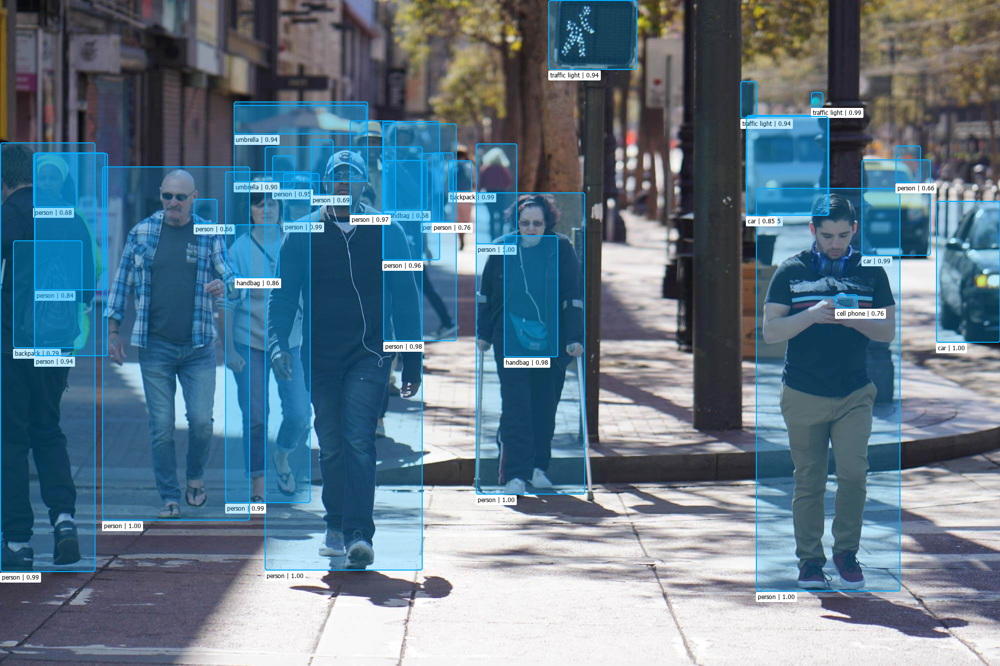

In [17]:
ImgDisp(filename='output/transformers/street_large.png')

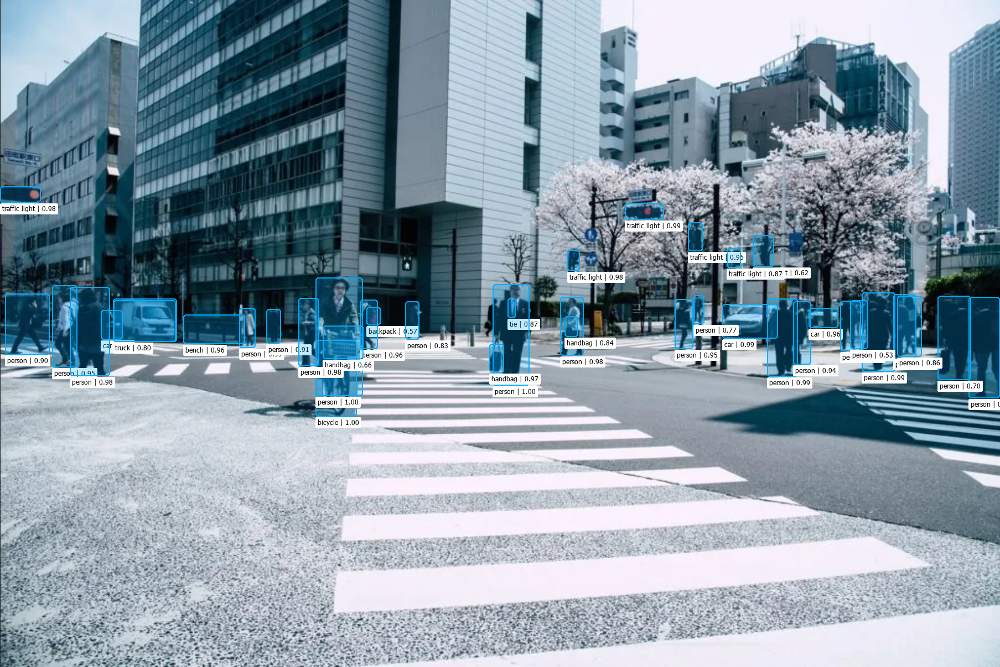

In [18]:
ImgDisp(filename='output/transformers/street_medium.png')

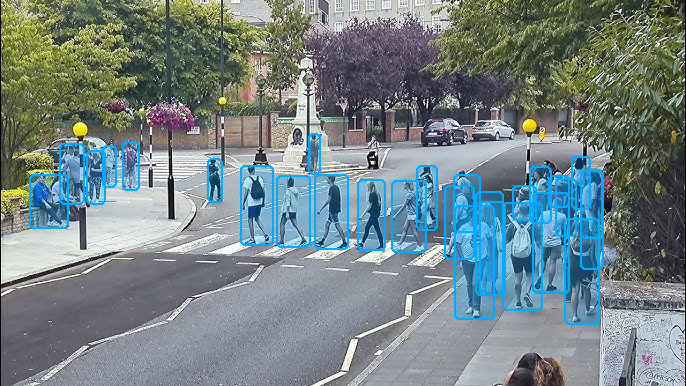

In [19]:
ImgDisp(filename='output/transformers/street_small.png')

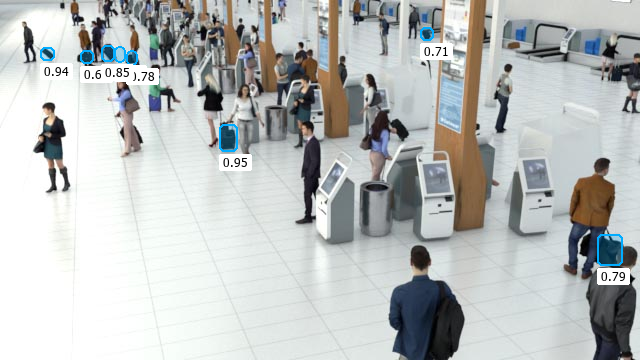

In [16]:
ImgDisp(filename='output/transformers/airport.png')

### YOLO Transformer

Additionally we show how to use the YOLO interface for the detection transformers

In [22]:
# run model and obtain results
yolo_model = RTDETR("rtdetr-l.pt")
results = yolo_model("images/bar.png")


image 1/1 c:\Users\Wangelik\Desktop\Object Detection\images\bar.png: 640x640 21 persons, 13 bicycles, 1 fire hydrant, 4 handbags, 1 apple, 14 potted plants, 1537.1ms
Speed: 18.0ms preprocess, 1537.1ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)


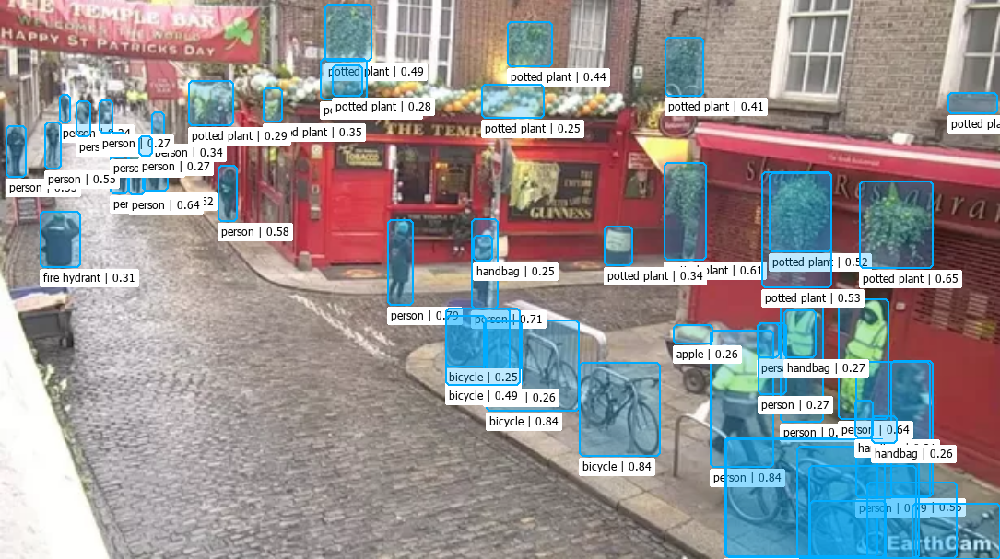

In [33]:
# show sample result
im = Image.open("images/bar.png").convert("RGBA")

for box in results[0].boxes:
    x1, y1, x2, y2 = box.xyxy[0].tolist()
    im = add_bounding_box(im, 
                          [x1, y1, x2, y2],
                          label=yolo_model.names[int(box.cls)],
                          score=box.conf.item(),
                          font=font)

im